In [1]:
!nvidia-smi

Mon Mar 21 23:50:19 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    26W / 300W |      0MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Libraries

In [ ]:
!pip install wav2clip
!pip install git+https://github.com/openai/CLIP.git
!pip install transformers
!pip install decord
!pip install pydub
!pip install magenta

In [ ]:
import torch
import torchvision
import numpy as np
import librosa
import librosa.display
from PIL import Image
import wav2clip as nyu_wav2clip
import clip as openai_clip
import glob
import cv2
from scipy.spatial.distance import cosine, directed_hausdorff, cityblock
from google.colab.patches import cv2_imshow
from decord import VideoReader, cpu, gpu
from moviepy.editor import *
import matplotlib.pyplot as plt
from pydub import AudioSegment
import IPython.display as ipd
from magenta.models.nsynth import utils
from magenta.models.nsynth.wavenet import fastgen
import tensorflow as tf
import logging
tf.get_logger().setLevel(logging.ERROR)

In [ ]:
from google.colab import drive
from google.colab import files
drive.mount('/content/drive')

# Models and Parameters

In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"
clip, preprocess = openai_clip.load("ViT-B/32", device=device)
resnet18 = torchvision.models.resnet18(pretrained=True).to(device)
wav2clip = nyu_wav2clip.get_model()

100%|███████████████████████████████████████| 338M/338M [00:05<00:00, 60.7MiB/s]
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

Downloading: "https://github.com/descriptinc/lyrebird-wav2clip/releases/download/v0.1.0-alpha/Wav2CLIP.pt" to /root/.cache/torch/hub/checkpoints/Wav2CLIP.pt


  0%|          | 0.00/46.7M [00:00<?, ?B/s]

In [6]:
def get_clip_img_embeddings(img):
  transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToPILImage(),
  ])
  t_img = transforms(img)
  with torch.no_grad():
    img_features = clip.encode_image(preprocess(t_img).unsqueeze(0).to(device))
    img_features /= img_features.norm(dim=-1, keepdim=True)
  return img_features

def get_clip_text_embeddings(text):
  with torch.no_grad():
    text_features = clip.encode_text(openai_clip.tokenize(text).to(device))
    text_features /= text_features.norm(dim=-1, keepdim=True)
  return text_features

def get_resnet_img_embeddings(img):
  transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToPILImage(),
    torchvision.transforms.Resize(256),
    torchvision.transforms.CenterCrop(224),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
  ])
  t_img = transforms(img).to(device)
  img_features = torch.zeros(512)
  layer = resnet18._modules.get("avgpool")
  def copy_data(m, i, o):
    img_features.copy_(o.flatten())
  h = layer.register_forward_hook(copy_data)
  resnet18.eval()
  with torch.no_grad():
    resnet18(t_img.unsqueeze(0))  
  h.remove()
  return img_features

def get_wav2clip_audio_embeddings(audio):
  audio_features = nyu_wav2clip.embed_audio(audio, wav2clip)
  return audio_features

def get_wavenet_audio_embeddings(audio):
    checkpoint_path = f"{PATH}/files/wavenet-ckpt/model.ckpt-200000"
    neural_sample_rate = 16000
    encoding = fastgen.encode(audio, checkpoint_path, len(audio))
    return encoding.reshape((-1, 16))

In [7]:
PATH = "/content/drive/MyDrive/CMU/Github/LATTE"
TOP_K = 15

In [11]:
# Load from previously extracted video and audio .npy files
all_video_frames = np.load(f"{PATH}/files/all_video_frames.npy", allow_pickle=True)
print(len(all_video_frames))
all_audios = np.load(f"{PATH}/files/all_audios.npy", allow_pickle=True)
print(len(all_audios))

ref_vr = VideoReader(f"{PATH}/ref/cooking.mp4", ctx=cpu(0))
ref_fps = ref_vr.get_avg_fps()
ref_frame = ref_vr[-1].asnumpy()
ref_frame = cv2.resize(ref_frame, (224, 224), cv2.INTER_AREA)
ref_frame = cv2.cvtColor(ref_frame, cv2.COLOR_RGB2BGR)

ref_audio, sr = librosa.load(f"{PATH}/ref/chopping.wav")

1307
2257


# Display / Play

In [9]:
def plot(ref_frame, all_video_frames, sim_sorted):
  plt.figure(figsize=(5, 3), dpi=180)
  for i, frame_id in enumerate(sim_sorted):
    plt.subplot(3, 5, i + 1)
    plt.imshow(cv2.cvtColor(all_video_frames[frame_id[0]], cv2.COLOR_RGB2BGR))
    plt.xticks([])
    plt.yticks([])
  plt.tight_layout()
  plt.show()

def play(all_audios, sim_sorted):
  sr = 22050
  for item in sim_sorted:
    audio_obj = ipd.Audio(all_audios[item[0]], rate=sr)
    ipd.display(audio_obj)

# Extract video frames

In [ ]:
video_paths = glob.glob(f"{PATH}/mit_dataset/**/*.mp4", recursive=True)
all_video_frames = []

for video_path in video_paths:
  video_vr = VideoReader(video_path, ctx=cpu(0))
  video_fps = video_vr.get_avg_fps()
  for i in range(0, len(video_vr), int(video_fps / 2)):
    frame = video_vr[i].asnumpy()
    frame = cv2.resize(frame, (224, 224), cv2.INTER_AREA)
    frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
    all_video_frames.append(frame)

print(len(all_video_frames))

np.save('all_video_frames', all_video_frames)
# files.download('all_video_frames.npy')

# classes used: cooking, drawing, painting, racing

16145


# Extract audio

In [ ]:
audio_paths = glob.glob(f"{PATH}/mit_audio/**/*.aac", recursive=True)
all_audios = []

for audio_path in audio_paths:
  audio, sr = librosa.load(audio_path)
  all_audios.append(audio)

print(len(all_audios))

np.save('all_audios', all_audios)
# files.download('all_audios.npy')

# classes used: cooking, drumming

# Graphic Match Cut
*   Edges
*   Shapes (contours)
*   Color
*   ResNet features
*   CLIP features

## Edges

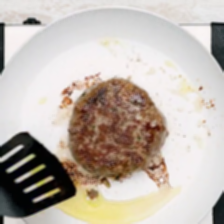

[(217, 1612.7616066858734), (286, 1612.7616066858734), (68, 1632.7966805453764), (144, 1632.7966805453764), (145, 1632.7966805453764), (156, 1632.7966805453764), (179, 1632.7966805453764), (218, 1632.7966805453764), (227, 1632.7966805453764), (303, 1632.7966805453764), (322, 1632.7966805453764), (476, 1632.7966805453764), (543, 1632.7966805453764), (957, 1632.7966805453764), (20, 1652.5888780940043)]


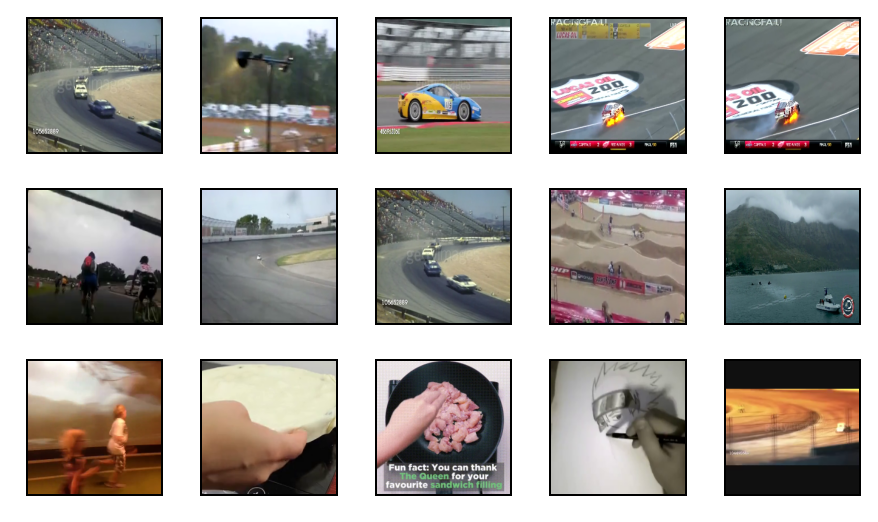

In [12]:
ref = cv2.GaussianBlur(ref_frame, (3, 3), cv2.BORDER_DEFAULT)
cv2_imshow(ref)
ref = cv2.cvtColor(ref, cv2.COLOR_BGR2GRAY)
high, thresh_im = cv2.threshold(ref, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) # Otsu's method
low = 0.5 * high
ref_edges = cv2.Canny(ref, low, high)
sim_dict = {}

for i, frame in enumerate(all_video_frames):
  frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
  frame = cv2.GaussianBlur(frame, (3, 3), cv2.BORDER_DEFAULT)
  high, thresh_im = cv2.threshold(frame, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
  low = 0.5 * high
  image_edges = cv2.Canny(frame, low, high)
  sim_dict[i] = directed_hausdorff(ref_edges, image_edges)[0]

sim_sorted = sorted(sim_dict.items(), key=lambda x: x[1], reverse=False)[:TOP_K]
print(sim_sorted)
# cv2_imshow(all_video_frames[286])

plot(ref_frame, all_video_frames, sim_sorted)

## Contours

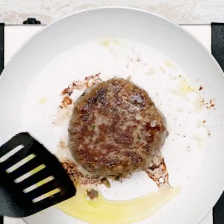

[(1175, 0.41491549226778274), (718, 0.4365809636829435), (1156, 0.4416060750344439), (401, 0.4758293922299071), (202, 0.4809746730593178), (1047, 0.5922287331858112), (1046, 0.5930738813533314), (373, 0.638692460313504), (586, 0.6684178224469302), (732, 0.7164945503875791), (316, 0.7577035056352955), (208, 0.7663369759990714), (543, 0.7939444874260446), (949, 0.8621545187498006), (1178, 0.894630761528483)]


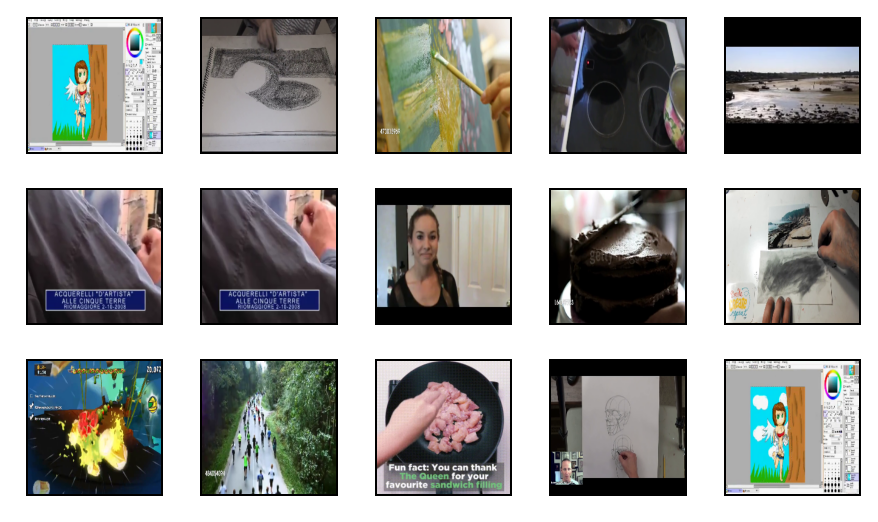

In [13]:
cv2_imshow(ref_frame)
ref = cv2.GaussianBlur(ref_frame, (3, 3), cv2.BORDER_DEFAULT)
ref = cv2.cvtColor(ref, cv2.COLOR_BGR2GRAY)
high, thresh_im = cv2.threshold(ref, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) # Otsu's method
low = 0.5 * high
ref_edges = cv2.Canny(ref, low, high)
ref_contours, hierarchy = cv2.findContours(ref_edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
ref_contour = max(ref_contours, key=cv2.contourArea)
ref_contour_img = cv2.drawContours(ref, ref_contour, -1, (0, 255, 0), 3)
# cv2_imshow(ref_contour_img)
sim_dict = {}

for i, frame in enumerate(all_video_frames):
  frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
  frame = cv2.GaussianBlur(frame, (3, 3), cv2.BORDER_DEFAULT)
  high, thresh_im = cv2.threshold(frame, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
  low = 0.5 * high
  image_edges = cv2.Canny(frame, low, high)
  image_contours, hierarchy = cv2.findContours(image_edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
  image_contour = max(image_contours, key=cv2.contourArea, default=0)
  sim_dict[i] = cv2.matchShapes(ref_contour, image_contour, 1, 0)

sim_sorted = sorted(sim_dict.items(), key=lambda x: x[1], reverse=False)[:TOP_K]
print(sim_sorted)

plot(ref_frame, all_video_frames, sim_sorted)

## Color histogram

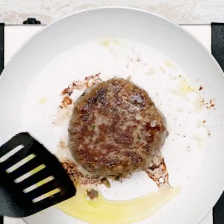

[(926, 0.2629383120682851), (925, 0.25514580919291946), (157, 0.2519569500425365), (927, 0.25145715521665585), (158, 0.2511594289749174), (924, 0.24387222231219208), (928, 0.23986900836680916), (160, 0.23741454817579064), (929, 0.22083886796318658), (156, 0.22014460631587343), (159, 0.21811407355746645), (930, 0.21627200507689476), (162, 0.19918031561838578), (847, 0.17995057601542813), (1185, 0.1781393541036203)]


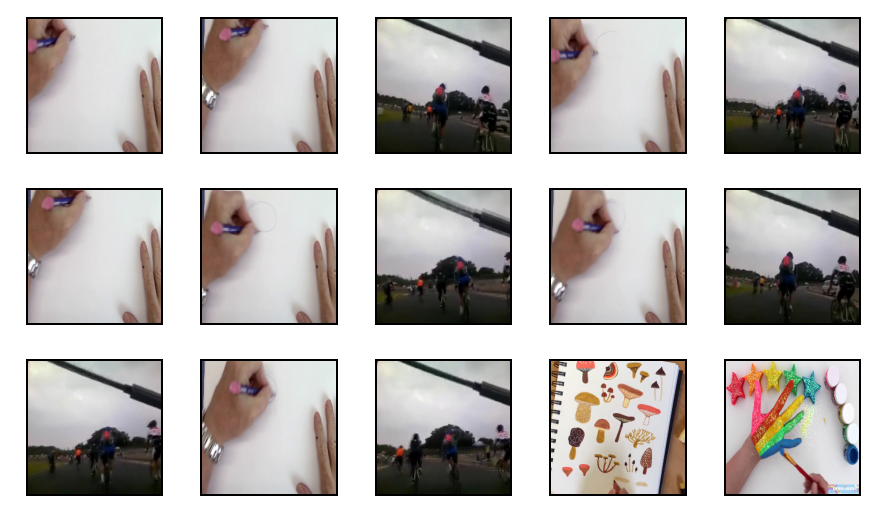

In [14]:
cv2_imshow(ref_frame)
ref_hist = cv2.calcHist([ref_frame], [0, 1, 2], None, [256, 256, 256], [0, 256, 0, 256, 0, 256])
cv2.normalize(ref_hist, ref_hist, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
sim_dict = {}

for i, frame in enumerate(all_video_frames):
  image_hist = cv2.calcHist([frame], [0, 1, 2], None, [256, 256, 256], [0, 256, 0, 256, 0, 256])
  cv2.normalize(image_hist, image_hist, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
  sim_dict[i] = cv2.compareHist(ref_hist, image_hist, cv2.HISTCMP_CORREL)

sim_sorted = sorted(sim_dict.items(), key=lambda x: x[1], reverse=True)[:TOP_K]
print(sim_sorted)

plot(ref_frame, all_video_frames, sim_sorted)

## ResNet features

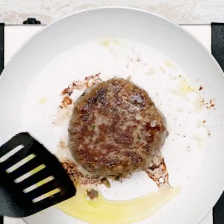

[(622, 0.7466002106666565), (443, 0.7431139349937439), (1220, 0.7375025153160095), (362, 0.7352535128593445), (361, 0.7221894264221191), (439, 0.7190830111503601), (417, 0.7184175848960876), (419, 0.7145148515701294), (445, 0.7133287191390991), (416, 0.7117325067520142), (470, 0.7114551067352295), (538, 0.7095573544502258), (415, 0.7095242142677307), (639, 0.7091615796089172), (414, 0.7079175710678101)]


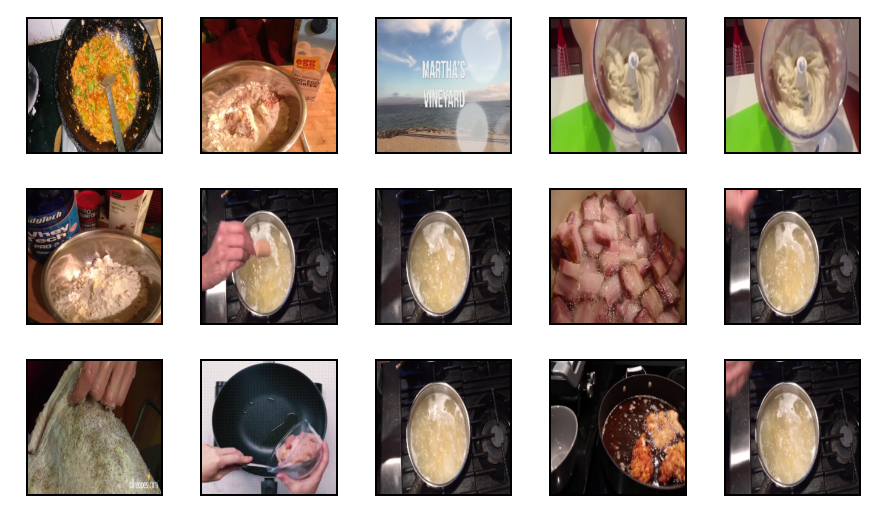

In [15]:
cv2_imshow(ref_frame)
ref_features = get_resnet_img_embeddings(ref_frame)
sim_dict = {}

for i, frame in enumerate(all_video_frames):
  image_features = get_resnet_img_embeddings(frame)
  cos = torch.nn.CosineSimilarity(dim=1, eps=1e-6)
  sim_dict[i] = cos(ref_features.unsqueeze(0), image_features.unsqueeze(0)).item()

sim_sorted = sorted(sim_dict.items(), key=lambda x: x[1], reverse=True)[:TOP_K]
print(sim_sorted)

plot(ref_frame, all_video_frames, sim_sorted)

## CLIP features (semantic)

In [ ]:
cv2_imshow(ref_frame)
ref_features = get_clip_img_embeddings(ref_frame)
sim_dict = {}

for i, frame in enumerate(all_video_frames):
  image_features = get_clip_img_embeddings(frame)
  cos = torch.nn.CosineSimilarity(dim=1, eps=1e-6)
  sim_dict[i] = cos(ref_features, image_features).item()

sim_sorted = sorted(sim_dict.items(), key=lambda x: x[1], reverse=True)[:TOP_K]
print(sim_sorted)

plot(ref_frame, all_video_frames, sim_sorted)

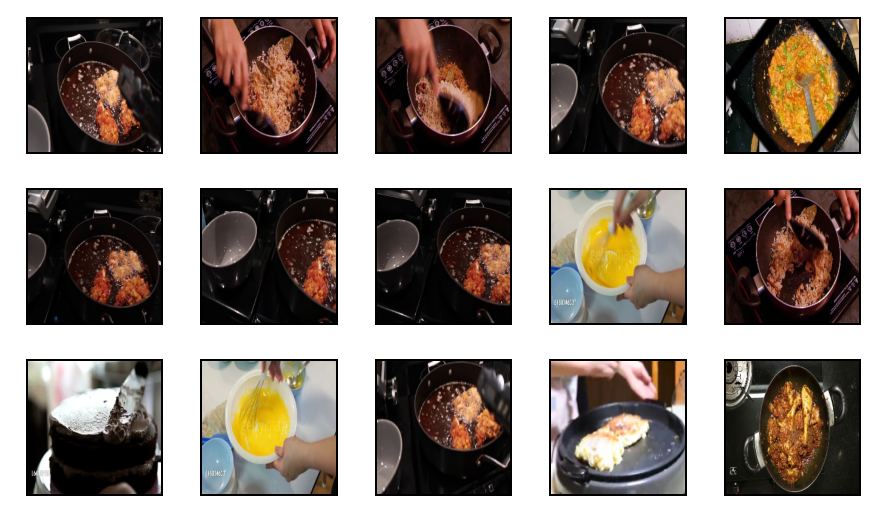

In [16]:
# CLIP takes a long time to run, below are the results

sim_sorted = [(641, 0.82763671875), (482, 0.81884765625), (477, 0.8154296875), (639, 0.81494140625), (623, 0.8095703125), (636, 0.80712890625), (638, 0.8037109375), (637, 0.80224609375), (384, 0.79345703125), (483, 0.79052734375), (587, 0.78564453125), (385, 0.78515625), (640, 0.7841796875), (456, 0.78369140625), (573, 0.77978515625)]

plot(ref_frame, all_video_frames, sim_sorted)

# Sound Match Cut
*   Beat / tempo / rhythme?
*   Spectrogram + DTW?
*   wav2clip features?

extract features, such as pitch over time, frequency spectrum, autocorrelation, dynamic range, transients, etc.

## Beat

In [ ]:
def lcsubstring_length(a, b):
  table = [[0] * (len(b) + 1) for _ in range(len(a) + 1)]
  l = 0
  for i, ca in enumerate(a, 1):
    for j, cb in enumerate(b, 1):
      if ca == cb:
        table[i][j] = table[i - 1][j - 1] + 1
        if table[i][j] > l:
          l = table[i][j]
  return l

ref_tempo, ref_beats = librosa.beat.beat_track(ref_audio)
ref_pattern = numpy.diff(ref_beats)
print(ref_pattern)
sim_dict = {}

audio_obj = ipd.Audio(ref_audio, rate=22050)
ipd.display(audio_obj)

for i, audio in enumerate(all_audios):
  audio_tempo, audio_beats = librosa.beat.beat_track(audio)
  audio_pattern = numpy.diff(audio_beats)
  sim_dict[i] = lcsubstring_length(ref_pattern, audio_pattern)

sim_sorted = sorted(sim_dict.items(), key=lambda x: x[1], reverse=True)[:TOP_K]
print(sim_sorted)

play(all_audios, sim_sorted)

[29 27 28 26 27 26 27 27]


[(1172, 4), (207, 3), (291, 3), (391, 3), (823, 3), (872, 3), (1233, 3), (1416, 3), (1809, 3), (14, 2), (21, 2), (23, 2), (48, 2), (73, 2), (87, 2)]


## Spectrogram

Exception ignored in: <function Wave_write.__del__ at 0x7fd84afa4d40>
Traceback (most recent call last):
  File "/usr/lib/python3.7/wave.py", line 327, in __del__
    self.close()
  File "/usr/lib/python3.7/wave.py", line 445, in close
    self._ensure_header_written(0)
  File "/usr/lib/python3.7/wave.py", line 465, in _ensure_header_written
    raise Error('sample width not specified')
wave.Error: sample width not specified


[(114, 0.49006651993403505), (128, 0.17690170332505595), (100, 0.08961391346270509), (130, 0.05868416684808442), (110, 0.03159181390411592)]


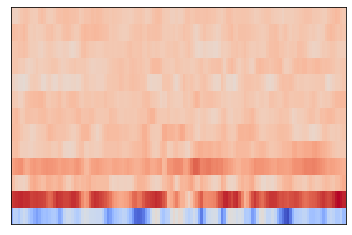

In [ ]:
ref_features = librosa.feature.mfcc(ref_audio, n_mfcc=13)
librosa.display.specshow(ref_features)
ref_stddev_mfccs = np.std(ref_features, axis=1)
ref_mean_mfccs = np.mean(ref_features, axis=1)
ref_average_difference = np.zeros((13,))
for i in range(0, len(ref_features.T) - 2, 2):
    ref_average_difference += ref_features.T[i] - ref_features.T[i+1]
ref_average_difference /= (len(ref_features) // 2)   
ref_average_difference = np.array(ref_average_difference)
ref_concat_features = np.hstack((ref_stddev_mfccs, ref_mean_mfccs))
ref_concat_features = np.hstack((ref_concat_features, ref_average_difference))

sim_dict = {}

for i, audio in enumerate(all_audios):
  audio_features = librosa.feature.mfcc(audio, n_mfcc=13)
  librosa.display.specshow(audio_features)
  audio_stddev_mfccs = np.std(audio_features, axis=1)
  audio_mean_mfccs = np.mean(audio_features, axis=1)
  audio_average_difference = np.zeros((13,))
  for i in range(0, len(audio_features.T) - 2, 2):
      audio_average_difference += audio_features.T[i] - audio_features.T[i+1]
  audio_average_difference /= (len(audio_features) // 2)   
  audio_average_difference = np.array(audio_average_difference)
  audio_concat_features = np.hstack((audio_stddev_mfccs, audio_mean_mfccs))
  audio_concat_features = np.hstack((audio_concat_features, audio_average_difference))
  
  # sim_dict[i] = np.mean(librosa.segment.cross_similarity(ref_features, audio_features, metric='cosine', mode='affinity'))
  sim_dict[i] = distance.cosine(ref_concat_features, audio_concat_features)

sim_sorted = sorted(sim_dict.items(), key=lambda x: x[1], reverse=True)[:TOP_K]
print(sim_sorted)

play(all_audios, sim_sorted)

## WaveNet

In [68]:
from scipy.spatial import distance

ref_features = get_wavenet_audio_embeddings(ref_audio)
ref_stddev_wavenet = np.std(ref_features, axis=0)
ref_mean_wavenet = np.mean(ref_features, axis=0)
ref_average_difference_wavenet = np.zeros((16,))
for i in range(0, len(ref_features) - 2, 2):
    ref_average_difference_wavenet += ref_features[i] - ref_features[i+1]
ref_average_difference_wavenet /= (len(ref_features) // 2)   
ref_average_difference_wavenet = np.array(ref_average_difference_wavenet)
ref_concat_features_wavenet = np.hstack((ref_stddev_wavenet, ref_mean_wavenet))
ref_concat_features_wavenet = np.hstack((ref_concat_features_wavenet, ref_average_difference_wavenet))
# print(ref_concat_features_wavenet)
sim_dict = {}

for i, audio in enumerate(all_audios):
  audio_features = get_wavenet_audio_embeddings(audio)
  audio_stddev_wavenet = np.std(audio_features, axis=0)
  audio_mean_wavenet = np.mean(audio_features, axis=0)
  audio_average_difference_wavenet = np.zeros((16,))
  for i in range(0, len(audio_features) - 2, 2):
      audio_average_difference_wavenet += audio_features[i] - audio_features[i+1]
  audio_average_difference_wavenet /= (len(audio_features) // 2)   
  audio_average_difference_wavenet = np.array(audio_average_difference_wavenet)
  audio_concat_features_wavenet = np.hstack((audio_stddev_wavenet, audio_mean_wavenet))
  audio_concat_features_wavenet = np.hstack((audio_concat_features_wavenet, audio_average_difference_wavenet))
  # print(audio_concat_features_wavenet.shape)
  sim_dict[i] = distance.cosine(ref_concat_features_wavenet, audio_concat_features_wavenet)

sim_sorted = sorted(sim_dict.items(), key=lambda x: x[1], reverse=False)[:TOP_K]
print(sim_sorted)

play(all_audios, sim_sorted)

[(108, 0.015576691686858823), (100, 0.02036781215853234), (114, 0.03076922740196264), (128, 0.05284101981891498), (126, 1.2078232031706504)]


## wav2clip features (semantic)

In [ ]:
ref_features = get_wav2clip_audio_embeddings(ref_audio)
sim_dict = {}

for i, audio in enumerate(all_audios):
  audio_features = get_wav2clip_audio_embeddings(audio)
  cos = torch.nn.CosineSimilarity(dim=1, eps=1e-6)
  sim_dict[i] = cos(torch.from_numpy(ref_features).float(), torch.from_numpy(audio_features).float()).item()

sim_sorted = sorted(sim_dict.items(), key=lambda x: x[1], reverse=True)[:TOP_K]
print(sim_sorted)

play(all_audios, sim_sorted)

[(832, 0.7483950853347778), (1732, 0.7371342778205872), (1776, 0.7335050702095032), (1357, 0.7246200442314148), (937, 0.7185631990432739), (1738, 0.7114842534065247), (1757, 0.7090282440185547), (403, 0.7002182006835938), (1546, 0.6917101740837097), (33, 0.6873571276664734), (1489, 0.6869704723358154), (371, 0.6838329434394836), (780, 0.6807951927185059), (850, 0.6772956252098083), (508, 0.6670535206794739)]
